This notebook coonducts a semantic clustering analysis of ChatGPT questions collected through the game '20 Questions'.

# Imports

In [1]:
%load_ext autoreload
%autoreload 2

import textract
import warnings
from scipy.cluster import hierarchy
from sentence_transformers import SentenceTransformer
import src.ChatGPTAnalysis.clustering as gpt_clus

c:\Users\rogal\miniconda3\envs\Playing20QWithNature\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Compute Question Embedding

Import transcripts

In [2]:
whole_text = textract.process("../data/transcripts.docx")
text = str(whole_text).split("\\n\\n")

Extract Questions and Compute Question Embeddings

In [3]:
all_questions_with_duplicates = gpt_clus.extract_questions(text)
all_questions = list(set(all_questions_with_duplicates))

#questions in positions 1 to 3 of the game
questions_level_1to3_with_duplicates = gpt_clus.extract_questions_by_position([1,2,3], text)
questions_level_1to3 = list(set(questions_level_1to3_with_duplicates))

questions_level_with_duplicates = gpt_clus.extract_questions_by_position([1], text)
questions_level = list(set(questions_level_with_duplicates))

#define MPNET as model for semantic embeddings
model = SentenceTransformer('all-mpnet-base-v2')

all_question_embeddings = gpt_clus.embed(model, all_questions)
all_question_embeddings_with_duplicates = gpt_clus.embed(model, all_questions_with_duplicates)
questions_level_1to3_embeddings = gpt_clus.embed(model, questions_level_1to3)
questions_level_embeddings = gpt_clus.embed(model, questions_level)

# Hierarchical Clustering Analysis

Linkage

In [4]:
Z = hierarchy.linkage(all_question_embeddings, 'average', metric = gpt_clus.compute_similarity)
Z_1to3 = hierarchy.linkage(questions_level_1to3_embeddings, 'average', metric = gpt_clus.compute_similarity)
Z_level= hierarchy.linkage(questions_level_embeddings, 'average', metric = gpt_clus.compute_similarity)

## Dendrogram without Truncation

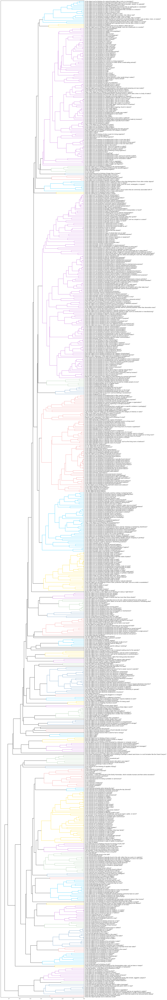

In [5]:
gpt_clus.get_truncated_dendrogram(Z, truncate_labels = all_questions_with_duplicates,figsize =(15, 180), labels = all_questions_with_duplicates, color_threshold = 0.4)

## Dendrogram truncated at threshold 0.4 with cluster size limit

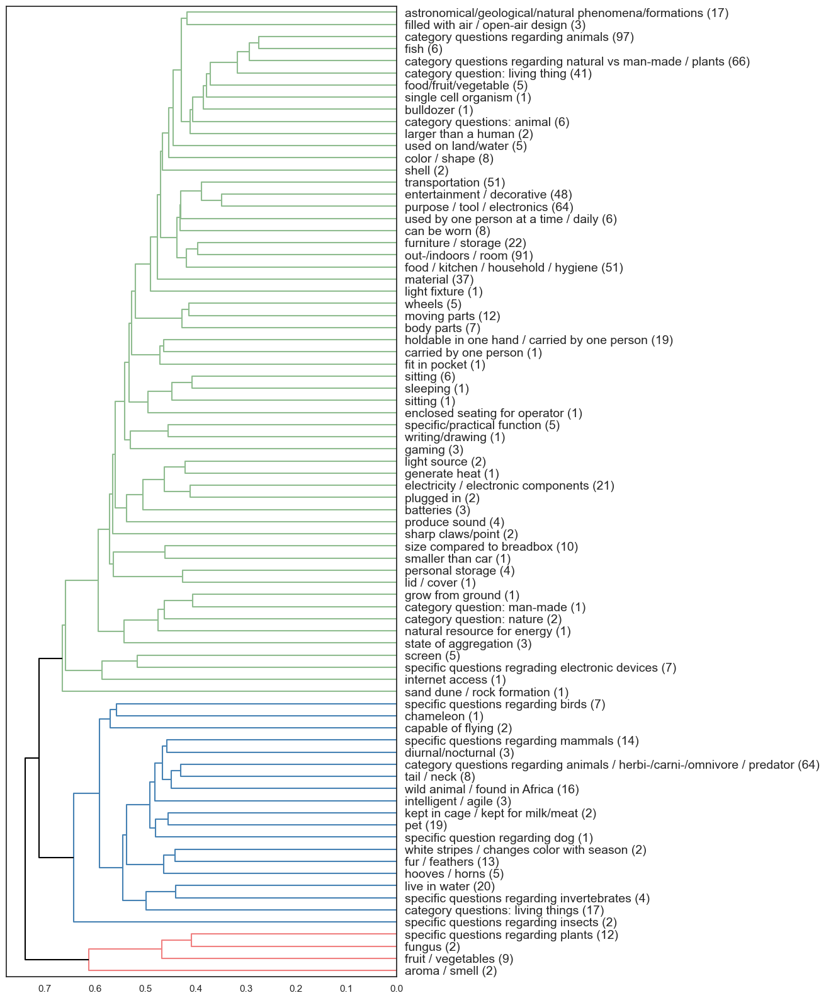

In [6]:
truncate_labels = ["aroma / smell", "fruit / vegetables", "fungus", "specific questions regarding plants", "specific questions regarding insects", "category questions: living things", "specific questions regarding invertebrates", "live in water", "hooves / horns", "fur / feathers", "white stripes / changes color with season", 
          "specific question regarding dog", "pet", "kept in cage / kept for milk/meat", "intelligent / agile", "wild animal / found in Africa", "tail / neck", "category questions regarding animals / herbi-/carni-/omnivore / predator", "diurnal/nocturnal", "specific questions regarding mammals", 
          "capable of flying", "chameleon", "specific questions regarding birds", "sand dune / rock formation", "internet access", "specific questions regrading electronic devices", "screen", "state of aggregation", "natural resource for energy", "category question: nature", "category question: man-made", "grow from ground", "lid / cover","personal storage",
          "smaller than car", "size compared to breadbox", "sharp claws/point", "produce sound", "batteries", "plugged in", "electricity / electronic components", "generate heat",
          "light source", "gaming", "writing/drawing", "specific/practical function", "enclosed seating for operator", "sitting", "sleeping", "sitting", "fit in pocket", "carried by one person", "holdable in one hand / carried by one person", "body parts", "moving parts", "wheels", "light fixture", "material",
          "food / kitchen / household / hygiene", "out-/indoors / room", "furniture / storage", "can be worn","used by one person at a time / daily", "purpose / tool / electronics", "entertainment / decorative", "transportation",
          "shell", "color / shape", "used on land/water","larger than a human", "category questions: animal", "bulldozer", "single cell organism", "food/fruit/vegetable", "category question: living thing","category questions regarding natural vs man-made / plants", "fish", "category questions regarding animals", "filled with air / open-air design","astronomical/geological/natural phenomena/formations"]

gpt_clus.get_truncated_dendrogram(Z, truncate_labels = truncate_labels,figsize = (8, 20), truncate_mode = 'threshold', truncate_threshold = 0.4, color_threshold = 0.7, labels = all_questions_with_duplicates, p = 100)

### Dendrogram with smaller clusters excluded

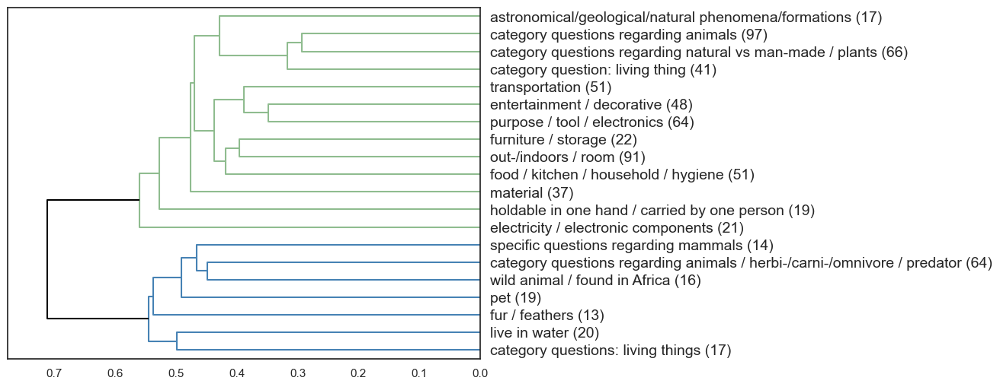

In [7]:
gpt_clus.get_truncated_dendrogram(Z, truncate_labels = truncate_labels,figsize = (8, 6), truncate_mode = 'threshold', truncate_threshold = 0.4, color_threshold = 0.7, labels = all_questions_with_duplicates, p = 100, min_clus_limit = True)

## Dendrogram with cluster size limit

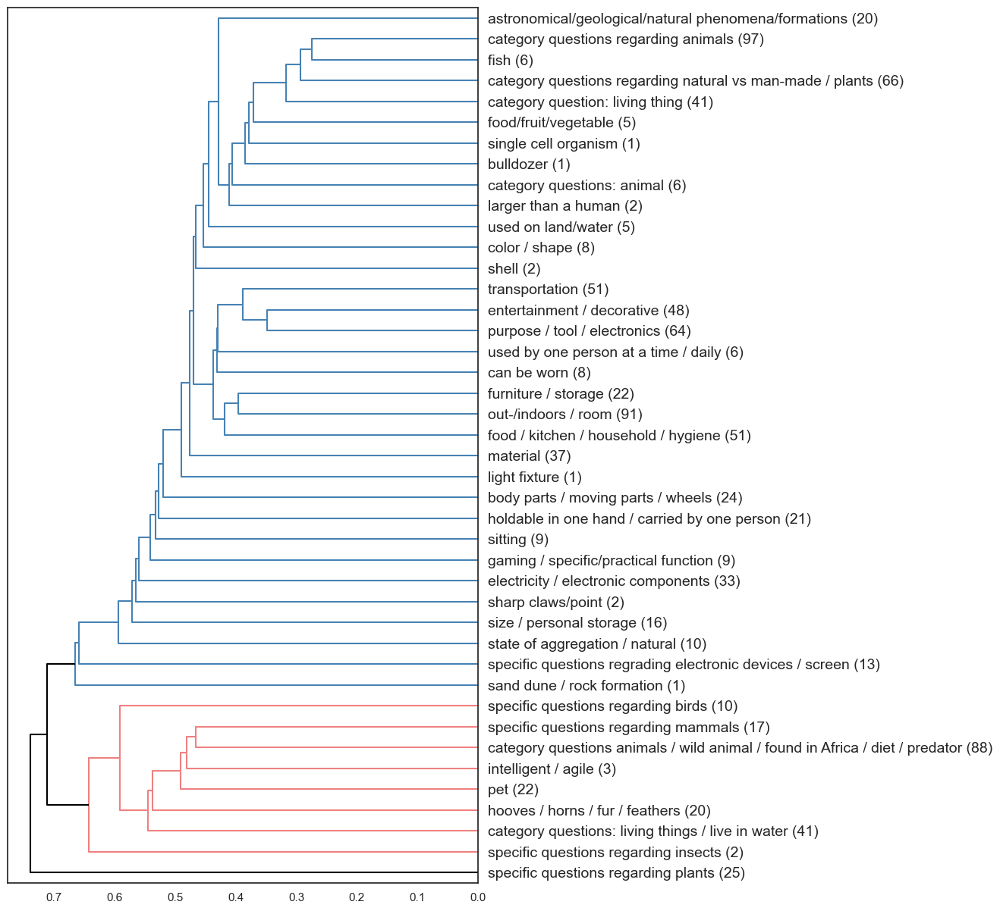

In [8]:
truncate_labels = ["specific questions regarding plants", "specific questions regarding insects", "category questions: living things / live in water", "hooves / horns / fur / feathers",
          "pet", "intelligent / agile", "category questions animals / wild animal / found in Africa / diet / predator", "specific questions regarding mammals", 
          "specific questions regarding birds", "sand dune / rock formation", "specific questions regrading electronic devices / screen", "state of aggregation / natural",
           "size / personal storage", "sharp claws/point", "electricity / electronic components",
          "gaming / specific/practical function", "sitting", "holdable in one hand / carried by one person", "body parts / moving parts / wheels", "light fixture", "material",
          "food / kitchen / household / hygiene", "out-/indoors / room", "furniture / storage", "can be worn","used by one person at a time / daily", "purpose / tool / electronics", "entertainment / decorative", "transportation",
          "shell", "color / shape", "used on land/water","larger than a human", "category questions: animal", "bulldozer", "single cell organism", "food/fruit/vegetable", "category question: living thing",
          "category questions regarding natural vs man-made / plants", "fish", "category questions regarding animals","astronomical/geological/natural phenomena/formations"]


gpt_clus.get_truncated_dendrogram(Z, truncate_labels = truncate_labels,figsize = (8, 15), truncate_mode = 'threshold', truncate_threshold = 1, color_threshold = 0.7, labels = all_questions_with_duplicates, p = 100, min_clus_limit = False)

### Dendrogram with smaller clusters excluded

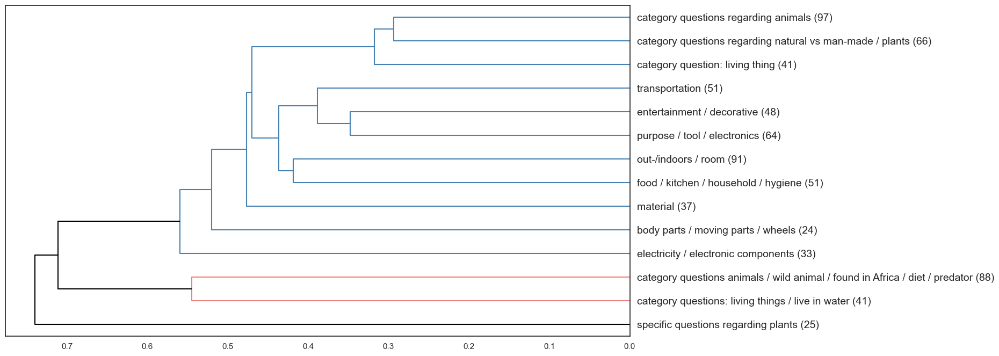

In [9]:
gpt_clus.get_truncated_dendrogram(Z, truncate_labels = truncate_labels,figsize = (15, 8), truncate_mode = 'threshold', truncate_threshold = 1, color_threshold = 0.7, labels = all_questions_with_duplicates, p = 100, min_clus_limit = True)

## Dendrogram levels 1-3

### Dendrogram levels 1-3 without truncation

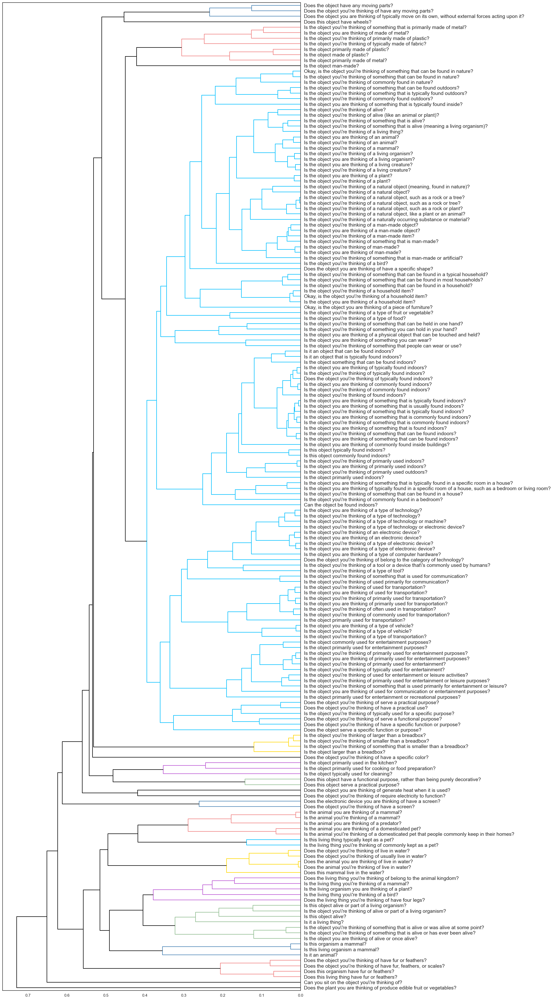

In [10]:
gpt_clus.get_truncated_dendrogram(Z_1to3, truncate_labels = questions_level_1to3_with_duplicates,figsize =(15, 50), labels = questions_level_1to3_with_duplicates, color_threshold = 0.4)

### Dendrogram level 1-3 with truncation

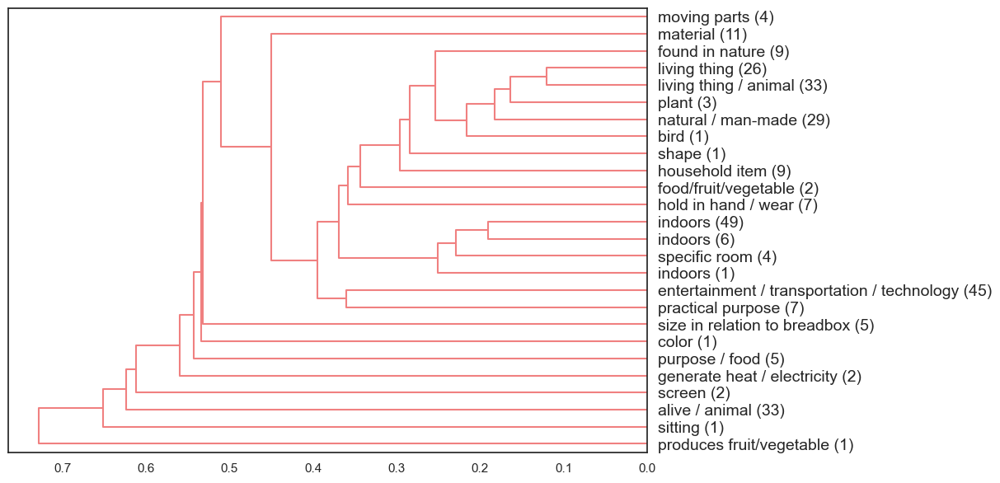

In [11]:
truncate_labels = ['produces fruit/vegetable', 'sitting', 'alive / animal', 
'screen', 'generate heat / electricity', 'purpose / food',  
'color', 'size in relation to breadbox',
          'practical purpose', 'entertainment / transportation / technology', 'indoors', 
          'specific room', 'indoors', 'indoors',
          'hold in hand / wear', 
          'food/fruit/vegetable', 'household item', "shape", 'bird', 
          'natural / man-made', 'plant', 'living thing / animal', 'living thing', 'found in nature', 'material', 'moving parts']
gpt_clus.get_truncated_dendrogram(Z_1to3, truncate_labels = truncate_labels,figsize = (10, 7), truncate_mode = 'threshold', truncate_threshold = 1, color_threshold = 1, labels = questions_level_1to3_with_duplicates, p = 50)

## Dendrogram Level 1 

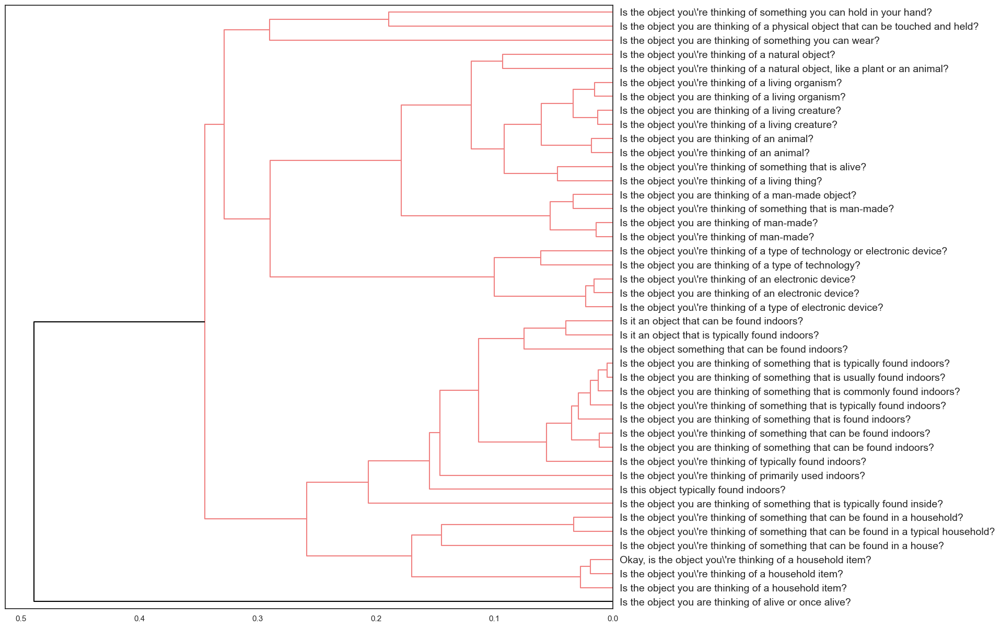

In [12]:
gpt_clus.get_truncated_dendrogram(Z_level, truncate_labels = questions_level_1to3_with_duplicates,  figsize =(15, 15), 
                               labels = questions_level_with_duplicates, color_threshold = 0.4)

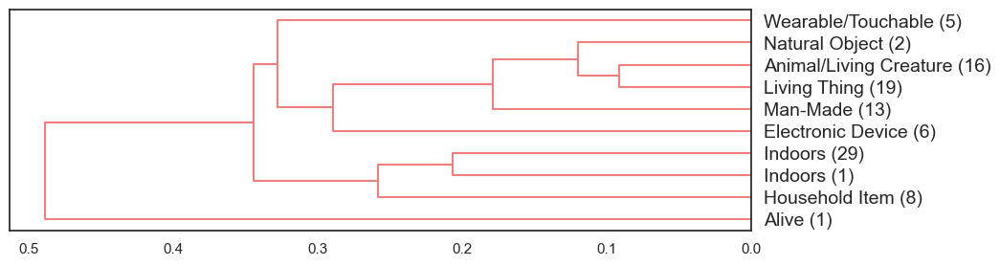

In [13]:
truncate_labels = ['Alive', 'Household Item', 'Indoors', 'Indoors', 'Electronic Device', 'Man-Made','Living Thing', 
                    'Animal/Living Creature', 'Natural Object', 'Wearable/Touchable']
                    
gpt_clus.get_truncated_dendrogram(Z_level, truncate_labels = truncate_labels,figsize = (10, 3), truncate_mode = 'threshold', 
                                        truncate_threshold = 1, color_threshold = 1, labels = questions_level_with_duplicates, p = 30)

# K- Means

'Elbow plot'

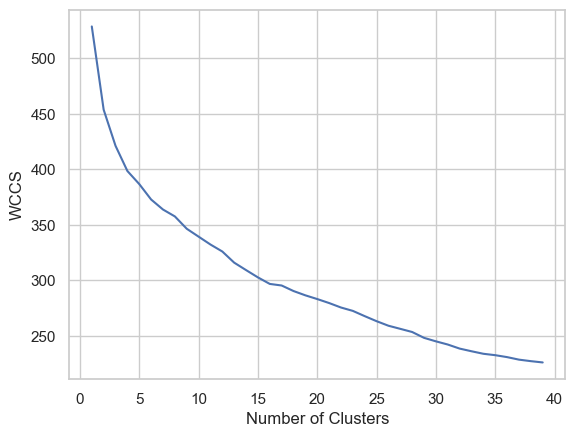

In [14]:
warnings.filterwarnings("ignore")
gpt_clus.plot_Elbow_chart(all_question_embeddings_with_duplicates)

K-Means with 20 clusters

In [15]:
c = gpt_clus.cluster(20, all_question_embeddings_with_duplicates)
labels = gpt_clus.get_labels_kMeans(c[1])

## Visualisation with Multidimensional Scaling

In [16]:
gpt_clus.visualise_KMeans(c[1], labels, all_questions_with_duplicates, all_question_embeddings_with_duplicates, 'MDS')

## Visualisation with t-SNE

In [17]:
gpt_clus.visualise_KMeans(c[1], labels, all_questions_with_duplicates, all_question_embeddings_with_duplicates, 'tSNE')